In [7]:
class SimulationParams:
    """A clean container holding all simulation parameters."""

    def __init__(self, params: dict):
        # 把所有参数写入成员变量
        for k, v in params.items():
            setattr(self, k, v)

    def __repr__(self):
        return "\n".join([f"{k} = {v}" for k, v in self.__dict__.items()])


def load_simulation_params(path):
    params = {}

    with open(path, "r") as f:
        for line in f:
            if "=" not in line:
                continue

            k, v = line.split("=")
            k = k.strip()
            v = v.strip()

            # attempt number conversion
            try:
                v = float(v) if "." in v else int(v)
            except:
                pass

            params[k] = v

    return SimulationParams(params)


In [8]:
from config_paths import OUT, FIGS

param = load_simulation_params(f"{OUT}/params.txt")
print(param)          # 打印所有参数


Lx = 30.0
Nx = 512
Np = 1000000
dt = 0.05
steps = 2000
v0 = 5.0
vth = 1.0
n0 = 1.0
Te = 2.0
outdir = output
diag_interval = 10
phase_snap = 50
vth_SI = 593096.9630832174
omega_p_SI = 1783986379.8348
lambdaD_SI = 0.0003324559928188124
dx = 0.05859375


γ_total (from energy): -4.082e+00  (1/step)


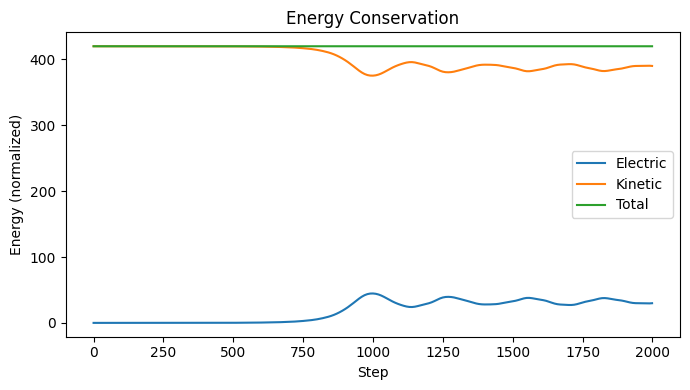

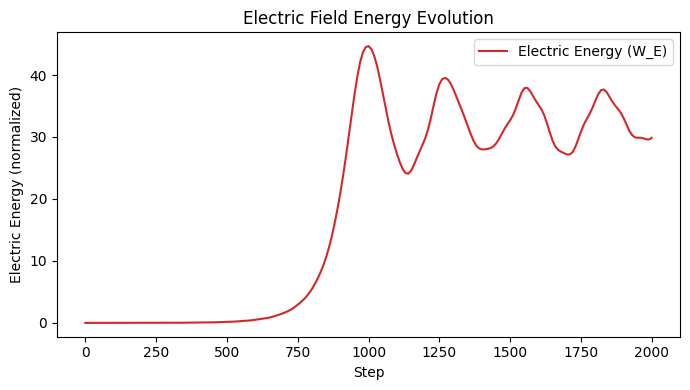

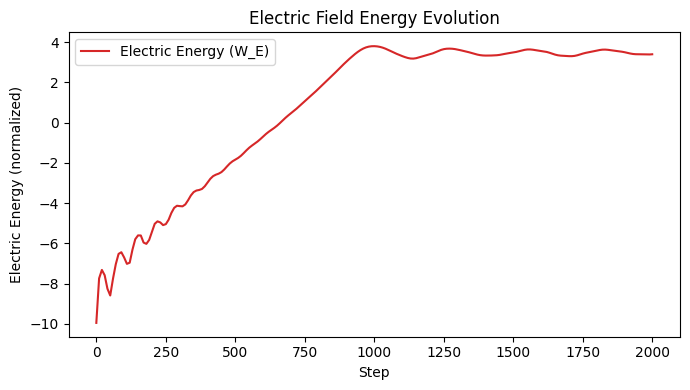

In [17]:
# diagnostics/plot_energy.py
import os, numpy as np, matplotlib.pyplot as plt
from diag_utils import ensure_dir, load_energy, robust_linear_fit
from config_paths import OUT, FIGS   # ✅ 直接导入全局路径

data = load_energy(OUT)
t, WE, WK, WT = data.T

# t = t*param.dt# /param.omega_p_SI  # 转为物理时间
# t

# -------------------------------
# 原有三条曲线：总能量图
# -------------------------------
plt.figure(figsize=(7,4))
plt.plot(t, WE, label="Electric")
plt.plot(t, WK, label="Kinetic")
plt.plot(t, WT, label="Total")
plt.xlabel("Step"); plt.ylabel("Energy (normalized)")
plt.title("Energy Conservation")
plt.legend(); plt.tight_layout()
# plt.savefig(os.path.join(FIGS, "energy_evolution.png"), dpi=150)

# -------------------------------
# ✅ 新增：仅电场能量图
# -------------------------------
plt.figure(figsize=(7,4))
plt.plot(t, WE, color='tab:red', label="Electric Energy (W_E)")
plt.xlabel("Step"); plt.ylabel("Electric Energy (normalized)")
plt.title("Electric Field Energy Evolution")
plt.legend(); plt.tight_layout()
# plt.savefig(os.path.join(FIGS, "electric_energy_only.png"), dpi=150)

# -------------------------------
# 拟合增长率（线性阶段）
# -------------------------------
plt.figure(figsize=(7,4))
plt.plot(t, np.log(WE), color='tab:red', label="Electric Energy (W_E)")
plt.xlabel("Step"); plt.ylabel("Electric Energy (normalized)")
plt.title("Electric Field Energy Evolution")
plt.legend(); plt.tight_layout()

a, b = robust_linear_fit(t, np.log(np.maximum(WE,1e-30)), frac=1/3)
gamma = 0.5*b
print(f"γ_total (from energy): {gamma:.3e}  (1/step)")


Fitted line: log(W_E) = -8.225e+00 + 1.244e-02 * t
γ (from energy fit) = 1.244e-01  (omega_pe)


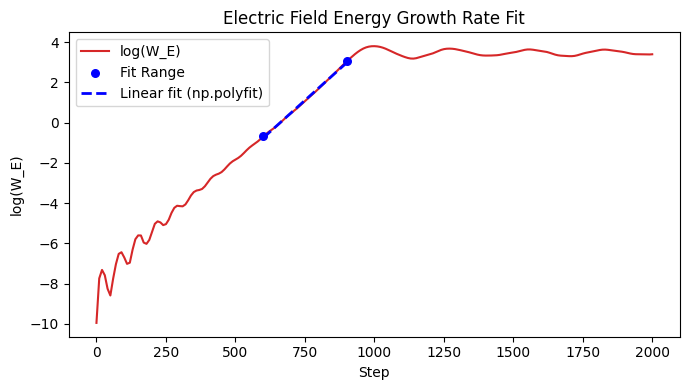

In [19]:
data = load_energy(OUT)
t, WE, WK, WT = data.T
# 选择拟合区间
fit_start = 600      
fit_end   = 900      

# 转换为索引
mask = (t >= fit_start) & (t <= fit_end)

t_fit  = t[mask]
WE_fit = WE[mask]
logWE      = np.log(np.maximum(WE,     1e-30))
logWE_fit  = np.log(np.maximum(WE_fit, 1e-30))

# 绘制原始能量曲线
plt.figure(figsize=(7,4))
plt.plot(t, logWE, color='tab:red', label="log(W_E)")


# 画出拟合区间的两个端点
plt.scatter([t_fit[0], t_fit[-1]],
            [logWE_fit[0], logWE_fit[-1]],
            color='blue', s=30, zorder=5, label="Fit Range")

# 用 np.polyfit 做线性拟合：log(W_E) ≈ a + b t
# polyfit 返回 [b, a]，b 是斜率，a 是截距
b, a = np.polyfit(t_fit, logWE_fit, 1)
print(f"Fitted line: log(W_E) = {a:.3e} + {b:.3e} * t")

# 对能量来说：W_E ~ exp(2 γ t)，所以 log(W_E) ~ const + 2γ t
# 因此 b = 2γ  →  γ = b / 2
gamma = 0.5 * b # 1/step

gamma = gamma / param.dt   # 1/dimensionless time unit
print(f"γ (from energy fit) = {gamma:.3e}  (omega_pe)")

# 拟合直线在整个 t_fit 上的值
logWE_fit_line = a + b * t_fit

# 拟合直线（虚线）
plt.plot(t_fit, logWE_fit_line,
         linestyle='--', color='blue', linewidth=2,
         label="Linear fit (np.polyfit)")

plt.xlabel("Step")
plt.ylabel("log(W_E)")
plt.title("Electric Field Energy Growth Rate Fit")
plt.legend()
plt.tight_layout()
plt.show()


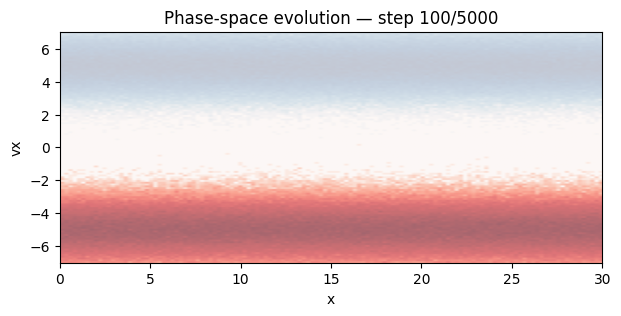

In [37]:
# diagnostics/make_phase_movie_html.py
import os, glob
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from diag_utils import ensure_dir
from config_paths import OUT, FIGS
from IPython.display import HTML

# 自动创建输出目录
files = sorted(glob.glob(os.path.join(OUT, "phase_*.npz")))
if not files:
    raise FileNotFoundError("❌ 未找到 phase_*.npz 文件，请先运行模拟。")

# 图设置
fig, ax = plt.subplots(figsize=(7,3))

def draw(i):
    d = np.load(files[i])

    # 获取三个 histogram（如果只存在 H_all，就退回老模式）
    if "H0" in d and "H1" in d and "H_all" in d:
        H0 = d["H0"]
        H1 = d["H1"]
        H_all = d["H_all"]
    else:
        # 老数据兼容：只有 H
        H_all = d["H"]
        H0 = None
        H1 = None

    xedges, vedges = d["xedges"], d["vedges"]

    # meta 优先（保存的 vmin/vmax）
    if "meta" in d:
        vmin, vmax, _ = d["meta"]
    else:
        vmin = vedges[0]; vmax = vedges[-1]

    ax.clear()

    # === 绘制 label=0 （蓝色流） ===
    if H0 is not None:
        ax.imshow(np.log10(H0.T + 1),
                  origin="lower",
                  extent=[xedges[0], xedges[-1], vmin, vmax],
                  aspect="auto",
                  cmap="Blues",
                  alpha=0.6)

    # === 绘制 label=1 （红色流） ===
    if H1 is not None:
        ax.imshow(np.log10(H1.T + 1),
                  origin="lower",
                  extent=[xedges[0], xedges[-1], vmin, vmax],
                  aspect="auto",
                  cmap="Reds",
                  alpha=0.6)

    # === 绘制全部背景（可选） ===
    # ax.imshow(np.log10(H_all.T + 1),
    #           origin="lower",
    #           extent=[xedges[0], xedges[-1], vmin, vmax],
    #           aspect="auto",
    #           cmap="Greys",
    #           alpha=0.2)

    ax.set_xlabel("x")
    ax.set_ylabel("vx")
    ax.set_title(f"Phase-space evolution — step {(i+1)*param.phase_snap}/{param.steps}")

    return []

ani = FuncAnimation(fig, draw, frames=len(files), interval=120, blit=False)

html_path = os.path.join(FIGS, "phase_evolution.html")
html_str = ani.to_jshtml()

try:
    display(HTML(html_str))
except Exception:
    print("ℹ️ 可手动在浏览器中打开 HTML 查看动画。")

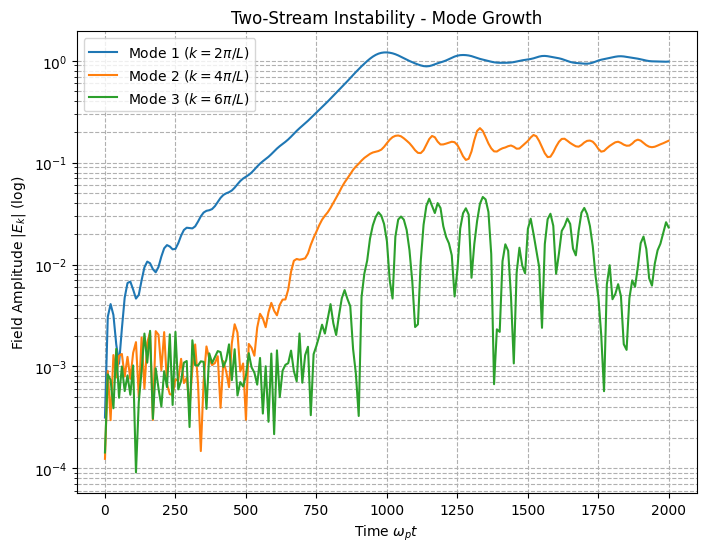

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from diag_utils import load_modes_history


data = load_modes_history(OUT)
t = data[:, 0]
mode1 = data[:, 1]
mode2 = data[:, 2]
mode3 = data[:, 3]

plt.figure(figsize=(8, 6))
plt.semilogy(t, mode1, label='Mode 1 ($k=2\pi/L$)')
plt.semilogy(t, mode2, label='Mode 2 ($k=4\pi/L$)')
plt.semilogy(t, mode3, label='Mode 3 ($k=6\pi/L$)')
plt.xlabel('Time $\omega_p t$')
plt.ylabel('Field Amplitude $|E_k|$ (log)')
plt.title('Two-Stream Instability - Mode Growth')
plt.legend()
plt.grid(True, which="both", ls="--")
plt.show()

Fitted line: log(W_E) = -5.798e+00 + 6.197e-03 * t
γ (from energy fit) = 1.239e-01  (omega_pe)


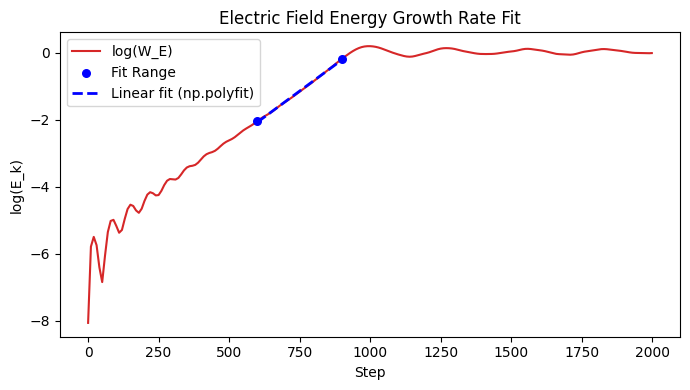

In [13]:
# 选择拟合区间
fit_start = 600      
fit_end   = 900      

# 转换为索引
mask = (t >= fit_start) & (t <= fit_end)

t_fit  = t[mask]
logmode = np.log(np.maximum(mode1, 1e-30))
logmode_fit = logmode[mask]
# 绘制原始能量曲线
plt.figure(figsize=(7,4))
plt.plot(t, logmode, color='tab:red', label="log(W_E)")


# 画出拟合区间的两个端点
plt.scatter([t_fit[0], t_fit[-1]],
            [logmode_fit[0], logmode_fit[-1]],
            color='blue', s=30, zorder=5, label="Fit Range")

# 用 np.polyfit 做线性拟合：log(W_E) ≈ a + b t
# polyfit 返回 [b, a]，b 是斜率，a 是截距
b, a = np.polyfit(t_fit, logmode_fit, 1)
print(f"Fitted line: log(W_E) = {a:.3e} + {b:.3e} * t")

# 对幅度来说：E_k ~ exp(γ t)，所以 log(E_k) ~ const + γ t
# 因此 b = γ
gamma =  b # 1/step

gamma = gamma / param.dt   # 1/dimensionless time unit
print(f"γ (from energy fit) = {gamma:.3e}  (omega_pe)")

# 拟合直线在整个 t_fit 上的值
mode_fit = a + b * t_fit

# 拟合直线（虚线）
plt.plot(t_fit, mode_fit,
         linestyle='--', color='blue', linewidth=2,
         label="Linear fit (np.polyfit)")

plt.xlabel("Step")
plt.ylabel("log(E_k)")
plt.title("Electric Field Energy Growth Rate Fit")
plt.legend()
plt.tight_layout()
plt.show()
